In [1]:
using Distributions
using StatsPlots
using StatsBase
using CSV
using DataFrames
using LinearAlgebra
using Random
using Turing

In [2]:
# helper function for getting probability/credibility interval
PI(d; p = 0.95) = [quantile(d, (1-p)/2), quantile(d, (1+p)/2)]

PI (generic function with 1 method)

In [3]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:];  # select only those data from adults

d2



Row,height,weight,age,male
,Float64,Float64,Float64,Int64
1,151.765,47.8256,63.0,1
2,139.7,36.4858,63.0,0
3,136.525,31.8648,65.0,0
4,156.845,53.0419,41.0,1
5,145.415,41.2769,51.0,0
6,163.83,62.9926,35.0,1
7,149.225,38.2435,32.0,0
8,168.91,55.48,27.0,1
9,147.955,34.8699,19.0,0


In [4]:
describe(d2)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,height,154.597,136.525,154.305,179.07,0,Float64
2,weight,44.9905,31.0711,44.7922,62.9926,0,Float64
3,age,41.1385,18.0,39.0,88.0,0,Float64
4,male,0.46875,0,0.0,1,0,Int64


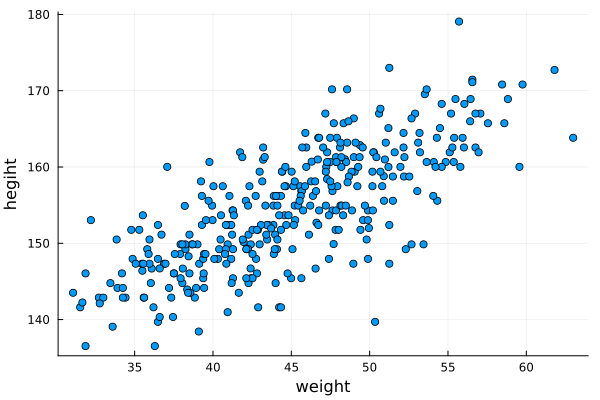

In [5]:
scatter(d2.weight, d2.height, xlabel="weight", ylabel="hegiht", legend=false)

In [6]:
x̄ = mean(d2.weight)
xlims = extrema(d2.weight)  # getting min and max in one pass

(31.071052, 62.992589)

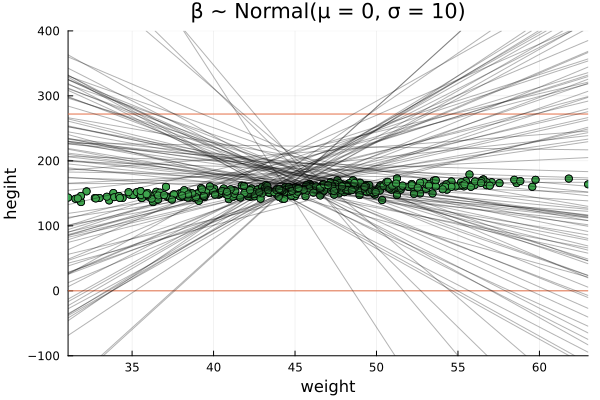

In [7]:
# see what the normal distributions for α and β give
Random.seed!(2971)
N = 100
α = rand(Normal(178, 20), N);
β = rand(Normal(0, 10), N);

p = hline!([0, 272]; ylims=(-100, 400), xlabel="weight", ylabel="hegiht", legend=false)
scatter!(d2.weight, d2.height)
title!("β ~ Normal(μ = 0, σ = 10)")

for (α_, β_) ∈ zip(α, β)
    plot!(x -> α_ + β_ * (x - x̄); xlims=xlims, c=:black, alpha=0.3, legend=false)
end
display(p)

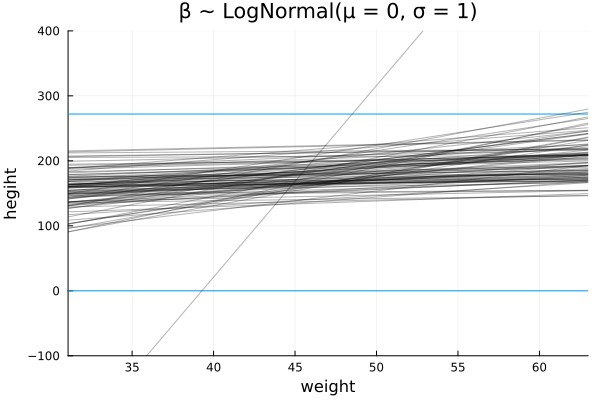

In [8]:
β = rand(LogNormal(0, 1), 10_000)
density(β, xlims=(0, 5), bandwidth=0.1)

# see what the log-normal distribution for β gives
p = hline([0, 272]; ylims=(-100, 400), xlabel="weight", ylabel="hegiht")
title!("β ~ LogNormal(μ = 0, σ = 1)")
for (α_, β_) ∈ zip(α, β)
  plot!(x -> α_ + β_ * (x - x̄); xlims=xlims, c=:black, alpha=0.3, legend=false)
end
display(p)


In [9]:
# define our Bayesian statistics model for linear regression
@model function height_regr_model(weight, height)
    α ~ Normal(178, 20)
    β ~ LogNormal(0, 1)
    μ = α .+ β * (weight .- x̄)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

height_regr_model (generic function with 2 methods)

In [10]:
m = sample(height_regr_model(d2.weight, d2.height), NUTS(), 1000)

Sampling   0%|█                                         |  ETA: N/A
┌ Info: Found initial step size
│   ϵ = 0.025
└ @ Turing.Inference C:\Users\pruth\.julia\packages\Turing\lkUBK\src\mcmc\hmc.jl:191
Sampling   0%|█                                         |  ETA: 0:46:37
Sampling   1%|█                                         |  ETA: 0:23:14
Sampling   1%|█                                         |  ETA: 0:15:25
Sampling   2%|█                                         |  ETA: 0:11:31
Sampling   2%|█                                         |  ETA: 0:09:10
Sampling   3%|██                                        |  ETA: 0:07:36
Sampling   3%|██                                        |  ETA: 0:06:29
Sampling   4%|██                                        |  ETA: 0:05:40
Sampling   4%|██                                        |  ETA: 0:05:01
Sampling   5%|██                                        |  ETA: 0:04:29
Sampling   5%|███                                       |  ETA: 0:04:04
Sampling 

Chains MCMC chain (1000×15×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 15.11 seconds
Compute duration  = 15.11 seconds
parameters        = α, β, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           α   154.6025    0.2586    0.0069   1392.5148   560.7249    0.9991   ⋯
           β     0.9024    0.0441    0.0013   1259.2790   847.0356    0.9991   ⋯
           σ     5.1003    0.1955    0.0055   1235.5621   720.1504    0.9995   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.

In [11]:
m_df_var = select(DataFrame(m), [:α, :β, :σ])
describe(m_df_var)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,α,154.603,153.907,154.592,155.275,0,Float64
2,β,0.902405,0.741051,0.902228,1.04128,0,Float64
3,σ,5.10025,4.54591,5.0893,5.8356,0,Float64


In [12]:
# now take 1000 samples from the posterior distribution obtained from the MC method
samples = sample(m, 1000)

# Use the mean values of α and β to plot the "best" fit line
α_MAP = mean(samples[:α])
β_MAP = mean(samples[:β])

0.9025782593952443

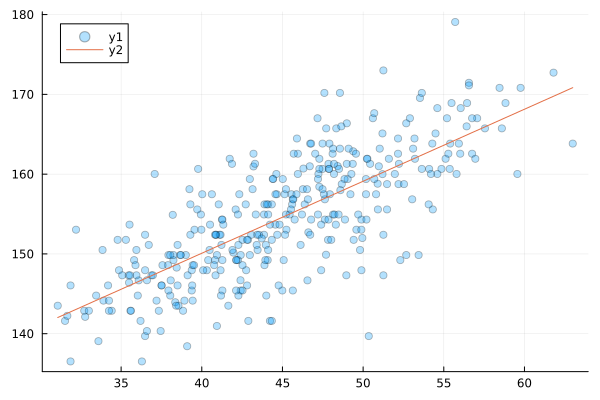

In [13]:
p = @df d2 scatter(:weight, :height; alpha=0.3)
plot!(x -> α_MAP + β_MAP*(x-x̄))


In [14]:
# Let's reduce the sample size to 10 to explore posterior distributions of α and β
N = 10
dN = d2[1:N,:]

Row,height,weight,age,male
,Float64,Float64,Float64,Int64
1,151.765,47.8256,63.0,1
2,139.7,36.4858,63.0,0
3,136.525,31.8648,65.0,0
4,156.845,53.0419,41.0,1
5,145.415,41.2769,51.0,0
6,163.83,62.9926,35.0,1
7,149.225,38.2435,32.0,0
8,168.91,55.48,27.0,1
9,147.955,34.8699,19.0,0


In [15]:
@model function height_regr_model_N(weight, height)
    α ~ Normal(178, 20)
    β ~ LogNormal(0, 1)
    x̄N = mean(weight)
    μ = α .+ β * (weight .- x̄N)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

height_regr_model_N (generic function with 2 methods)

In [16]:
mN = sample(height_regr_model_N(dN.weight, dN.height), NUTS(), 1000)

Sampling   0%|█                                         |  ETA: N/A
┌ Info: Found initial step size
│   ϵ = 0.8
└ @ Turing.Inference C:\Users\pruth\.julia\packages\Turing\lkUBK\src\mcmc\hmc.jl:191
Sampling   0%|█                                         |  ETA: 0:06:14
Sampling   1%|█                                         |  ETA: 0:03:06
Sampling   1%|█                                         |  ETA: 0:02:04
Sampling   2%|█                                         |  ETA: 0:01:33
Sampling   2%|█                                         |  ETA: 0:01:14
Sampling   3%|██                                        |  ETA: 0:01:01
Sampling   3%|██                                        |  ETA: 0:00:52
Sampling   4%|██                                        |  ETA: 0:00:46
Sampling   4%|██                                        |  ETA: 0:00:40
Sampling   5%|██                                        |  ETA: 0:00:36
Sampling   5%|███                                       |  ETA: 0:00:33
Sampling   

Chains MCMC chain (1000×15×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 2.51 seconds
Compute duration  = 2.51 seconds
parameters        = α, β, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse   ess_bulk   ess_tail      rhat    ⋯
      Symbol    Float64   Float64   Float64    Float64    Float64   Float64    ⋯

           α   152.8018    2.0011    0.0970   557.8156   358.8370    1.0005    ⋯
           β     0.9192    0.2089    0.0080   734.2556   405.0284    1.0021    ⋯
           σ     5.9825    2.1792    0.1427   278.8478   291.4783    1.0023    ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%

In [17]:
# sample 20 values of α and β from the posterior
samplesN = sample(mN, 20)
samplesN_df = DataFrame(samplesN);


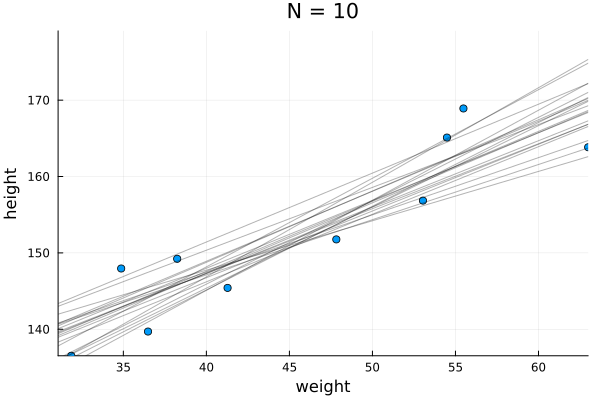

In [18]:
xlims = extrema(d2.weight)
ylims = extrema(d2.height)
p = @df dN scatter(:weight, :height; xlims=xlims, ylims=ylims, label=false)
title!("N = $N"; xlab="weight", ylab="height")

x̄N = mean(dN.weight)
for (α_, β_) ∈ zip(samplesN_df.α, samplesN_df.β)
    plot!(x -> α_ + β_ * (x-x̄N); c="black", alpha=0.3, legend=false)
end
display(p)

Sampling   0%|█                                         |  ETA: N/A
┌ Info: Found initial step size
│   ϵ = 0.2
└ @ Turing.Inference C:\Users\pruth\.julia\packages\Turing\lkUBK\src\mcmc\hmc.jl:191
Sampling   0%|█                                         |  ETA: 0:00:01
Sampling   1%|█                                         |  ETA: 0:00:00
Sampling   1%|█                                         |  ETA: 0:00:00
Sampling   2%|█                                         |  ETA: 0:00:00
Sampling   2%|█                                         |  ETA: 0:00:00
Sampling   3%|██                                        |  ETA: 0:00:00
Sampling   3%|██                                        |  ETA: 0:00:00
Sampling   4%|██                                        |  ETA: 0:00:00
Sampling   4%|██                                        |  ETA: 0:00:00
Sampling   5%|██                                        |  ETA: 0:00:00
Sampling   5%|███                                       |  ETA: 0:00:00
Sampling   

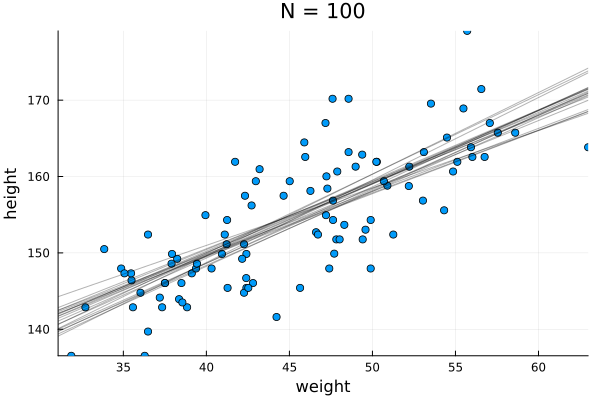

In [19]:
# Let's reduce the sample size to a different value to explore posterior distributions of α and β
N = 100
dN = d2[1:N,:];

mN = sample(height_regr_model_N(dN.weight, dN.height), NUTS(), 1000);

# sample 20 values of α and β from the posterior
samplesN = sample(mN, 20);
samplesN_df = DataFrame(samplesN);

p = @df dN scatter(:weight, :height; xlims=xlims, ylims=ylims, label=false)
title!("N = $N"; xlab="weight", ylab="height")

x̄N = mean(dN.weight)
for (α_, β_) ∈ zip(samplesN_df.α, samplesN_df.β)
    plot!(x -> α_ + β_ * (x-x̄N); c="black", alpha=0.3, legend=false)
end
display(p)

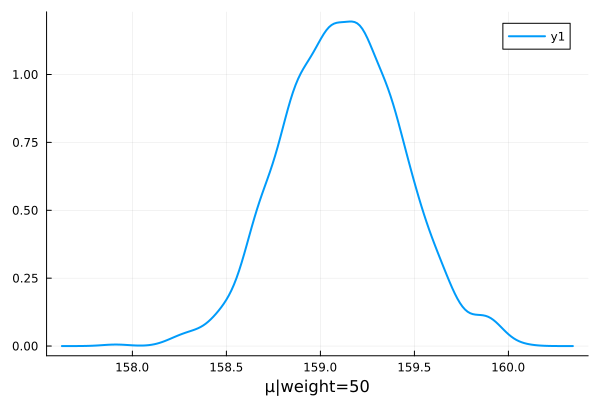

In [20]:
# Let's now go back to our original posterior distribution obtained from all the adult data
samples = sample(m, 1000)
samples_df = DataFrame(samples)

# posterior distribution of μ for one particular value of weight
μ_at_50 = @. samples_df.α + samples_df.β * (50 - x̄);
density(μ_at_50; lw=2, xlab="μ|weight=50")

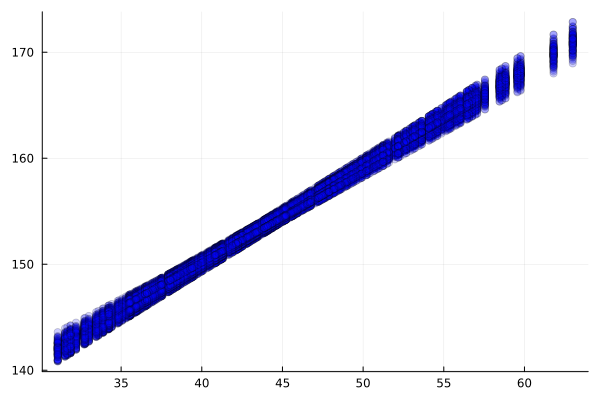

In [21]:
# now do the same for all weight values in the data
μ = map(w -> samples_df.α .+ samples_df.β * (w - x̄), d2.weight)

# 352-element vector where each element is a vector of 1000 elements
# these 1000 elements are obtained from 1000 combinations of α and β sampled from the posterior

μ = hcat(μ...) # turn the above array into 1000 x 352 matrix

# plot the first 100 values of μ
p = plot()
for i in 1:100
    scatter!(d2.weight, μ[i,:]; c=:blue, alpha=0.2, label=false)
end
display(p)

In [22]:
# Now, consider μ for a defined weight sequence (not the weight values from the data)
weight_seq = 25:70

μ_seq = map(w -> samples_df.α .+ samples_df.β * (w - x̄), weight_seq)
μ_seq = hcat(μ_seq...)

μ_seq_mean = mean.(eachcol(μ_seq))
μ_seq_PI = PI.(eachcol(μ_seq))
μ_seq_PI = vcat(μ_seq_PI'...) # convert vector of vector into 46x2 matrix # if using link

46×2 Matrix{Float64}:
 134.766  138.369
 135.739  139.205
 136.716  140.047
 137.697  140.868
 138.678  141.682
 139.659  142.525
 140.639  143.329
 141.62   144.154
 142.601  144.963
 143.582  145.771
   ⋮      
 168.423  171.509
 169.237  172.464
 170.05   173.421
 170.863  174.411
 171.676  175.402
 172.489  176.389
 173.302  177.363
 174.115  178.337
 174.919  179.311

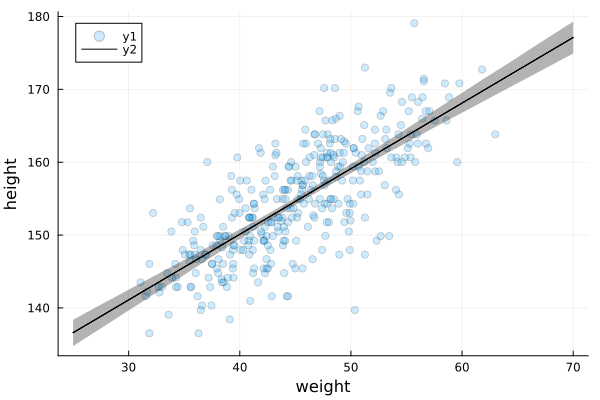

In [23]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, μ_seq_mean; c=:black)
plot!(weight_seq, [μ_seq_mean μ_seq_mean]; c=:black, fillrange=μ_seq_PI, fillalpha=0.3, label=false)


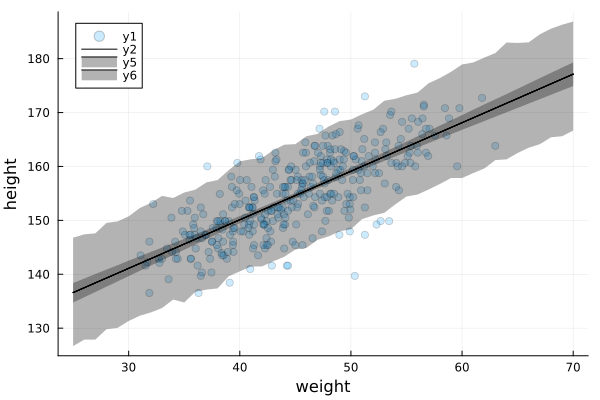

In [24]:
# We now do the similar simulation while including the effect of σ on the posterior distribution
sim_height = map(w -> rand.(Normal.(samples_df.α .+ samples_df.β * (w - x̄), samples_df.σ)), weight_seq)
sim_height = hcat(sim_height...);

height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

plot!(weight_seq, [μ_seq_mean μ_seq_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)
